In [1]:
import cv2
import time
import numpy as np
import matplotlib.pyplot as plt

import torch
import torch.nn.parallel
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

from torchvision import transforms
import hd3model
from models.hd3_ops import resize_dense_vector
import utils.flowlib as fl

In [2]:
def get_target_size(H, W):
    h = 64 * np.array([[H // 64, H // 64 + 1]])
    w = 64 * np.array([[W // 64, W // 64 + 1]])
    ratio = np.abs(np.matmul(np.transpose(h), 1 / w) - H / W)
    index = np.argmin(ratio)
    return h[0, index // 2], w[0, index % 2]

def flow_warp(x, flow, padding_mode='zeros'):
    """Warp an image or feature map with optical flow
    Args:
        x (Tensor): size (n, c, h, w) (image1)
        flow (Tensor): size (n, 2, h, w), values range from -1 to 1 (relevant to image width or height) (flow1->2)
        padding_mode (str): 'zeros' or 'border'

    Returns:
        Tensor: warped image or feature map
    """
    assert x.size()[-2:] == flow.size()[-2:]
    n, _, h, w = x.size()
    x_ = torch.arange(w).view(1, -1).expand(h, -1)
    y_ = torch.arange(h).view(-1, 1).expand(-1, w)
    grid = torch.stack([x_, y_], dim=0).float().cuda()
    grid = grid.unsqueeze(0).expand(n, -1, -1, -1)
    grid[:, 0, :, :] = 2 * grid[:, 0, :, :] / (w - 1) - 1
    grid[:, 1, :, :] = 2 * grid[:, 1, :, :] / (h - 1) - 1
    grid += 2 * flow
    grid = grid.permute(0, 2, 3, 1)
    return F.grid_sample(x, grid, padding_mode=padding_mode)

model = hd3model.HD3Model('flow', 'dlaup', 'hda', [4, 4, 4, 4, 4], True).cuda()
model = torch.nn.DataParallel(model).cuda()
cudnn.enabled = True
cudnn.benchmark = True
checkpoint = torch.load('model_zoo/hd3fc_chairs_things_kitti-bfa97911.pth')
model.load_state_dict(checkpoint['state_dict'], strict=True)
model.eval();

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
val_transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize(mean=mean, std=std)])

In [3]:
image1_path = '/home/ubuntu/hdd/data/kitti/RawData/2011_09_26/2011_09_26_drive_0017_sync/image_02/data/0000000000.png'
image2_path = '/home/ubuntu/hdd/data/kitti/RawData/2011_09_26/2011_09_26_drive_0017_sync/image_02/data/0000000001.png'
# image1_path = '/home/ubuntu/hdd/data/Cityscapes/leftImg8bit_sequence_trainvaltest/leftImg8bit_sequence/train/aachen/aachen_000014_000020_leftImg8bit.png'
# image2_path = '/home/ubuntu/hdd/data/Cityscapes/leftImg8bit_sequence_trainvaltest/leftImg8bit_sequence/train/aachen/aachen_000014_000021_leftImg8bit.png'

image1 = cv2.imread(image1_path)[:,:,::-1]
image2 = cv2.imread(image2_path)[:,:,::-1]
input_size = image1.shape
th, tw = get_target_size(input_size[0], input_size[1])
image1_resized = cv2.resize(image1, (tw, th))
image2_resized = cv2.resize(image2, (tw, th))
image1_resized_ = transforms.ToTensor()(image1_resized).unsqueeze(0).cuda()
image2_resized_ = transforms.ToTensor()(image2_resized).unsqueeze(0).cuda()
input_image1_pytorch = val_transform(image1_resized).unsqueeze(0).cuda()
input_image2_pytorch = val_transform(image2_resized).unsqueeze(0).cuda()

In [15]:
t = time.time()
with torch.no_grad():
    output1 = model([input_image1_pytorch, input_image2_pytorch])
    output2 = model([input_image2_pytorch, input_image1_pytorch])
    torch.cuda.synchronize()
print(time.time()-t)

0.19162845611572266


In [16]:
scale_factor = 1/4
output1['vect_resized'] = resize_dense_vector(output1['vect'] * scale_factor, th, tw)
output2['vect_resized'] = resize_dense_vector(output2['vect'] * scale_factor, th, tw)

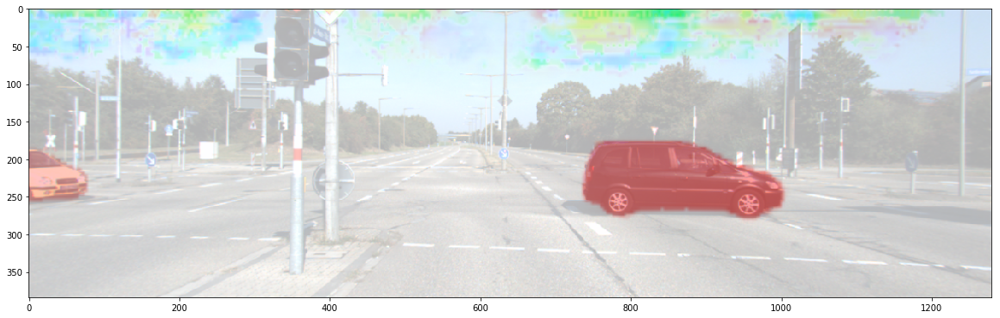

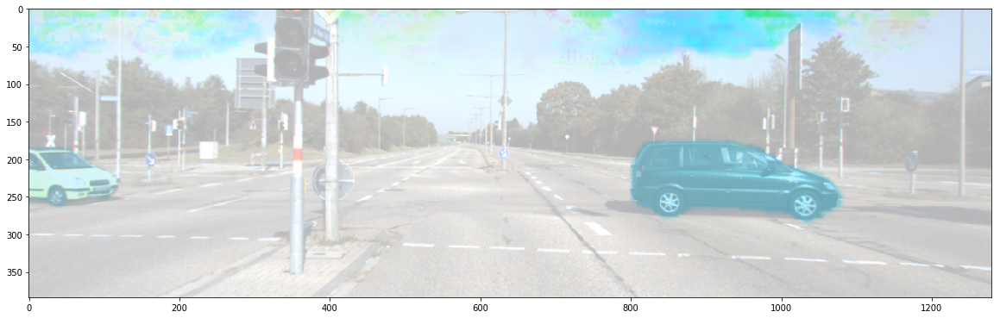

In [17]:
pred_vect1 = output1['vect_resized'].data.cpu().numpy()
pred_vect1_ = np.transpose(pred_vect1, (0, 2, 3, 1))
vis_flo1 = fl.flow_to_image(pred_vect1_[0])
pred_vect2 = output2['vect_resized'].data.cpu().numpy()
pred_vect2_ = np.transpose(pred_vect2, (0, 2, 3, 1))
vis_flo2 = fl.flow_to_image(pred_vect2_[0])
plt.figure(figsize=(20, 10))
plt.imshow(image1_resized)
plt.imshow(vis_flo1, alpha=0.7)
plt.figure(figsize=(20, 10))
plt.imshow(image2_resized)
plt.imshow(vis_flo2, alpha=0.7)

In [18]:
out1 = output1['vect_resized']
out1[:, 0] /= tw
out1[:, 1] /= th

out2 = output2['vect_resized']
out2[:, 0] /= tw
out2[:, 1] /= th

image_warped12 = flow_warp(image1_resized_, out2).permute(0, 2, 3, 1).cpu().numpy()[0]
image_warped21 = flow_warp(image2_resized_, out1).permute(0, 2, 3, 1).cpu().numpy()[0]

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


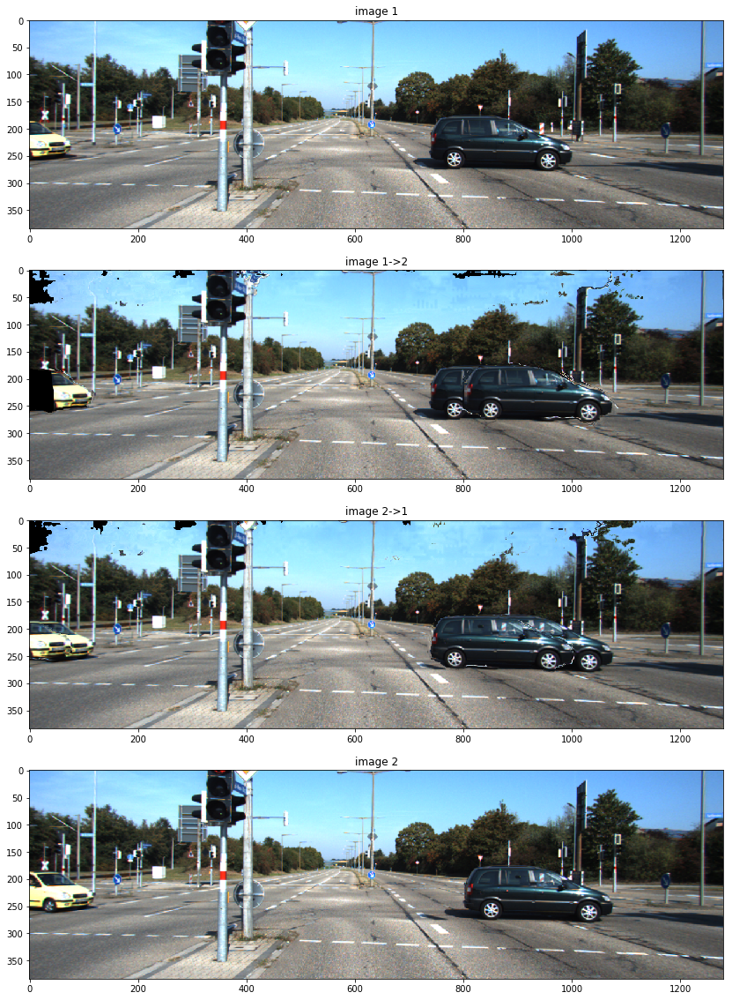

In [19]:
plt.figure(figsize=(20, 20))
plt.subplot(411)
plt.title('image 1')
plt.imshow(image1_resized)
plt.subplot(412)
plt.title('image 1->2')
plt.imshow(image_warped12)
plt.subplot(413)
plt.title('image 2->1')
plt.imshow(image_warped21)
plt.subplot(414)
plt.title('image 2')
plt.imshow(image2_resized)

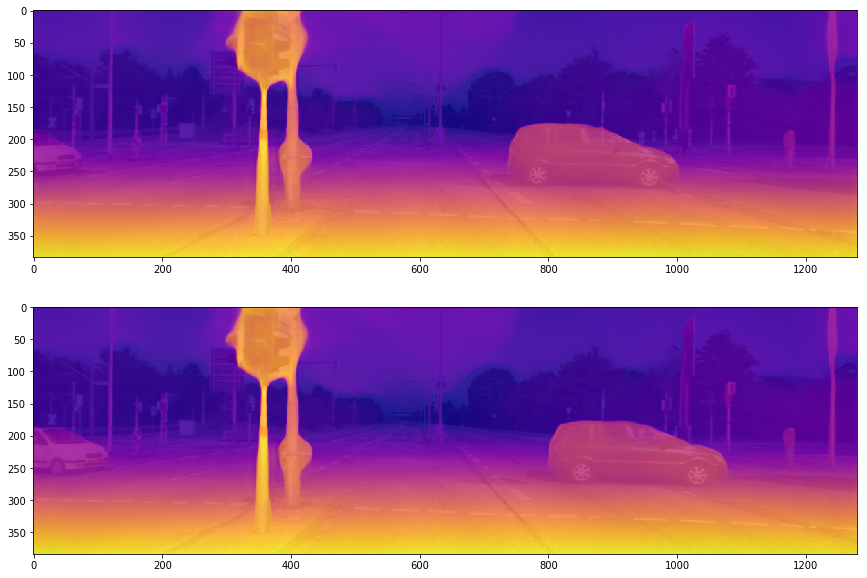

In [13]:
disp1 = cv2.resize(np.load('disp1.npy'), (1280, 384))
disp2 = cv2.resize(np.load('disp2.npy'), (1280, 384))

plt.figure(figsize=(20, 10))
plt.subplot(211)
plt.imshow(image1_resized)
plt.imshow(disp1, 'plasma', alpha=0.9)
plt.subplot(212)
plt.imshow(image2_resized)
plt.imshow(disp2, 'plasma', alpha=0.9)

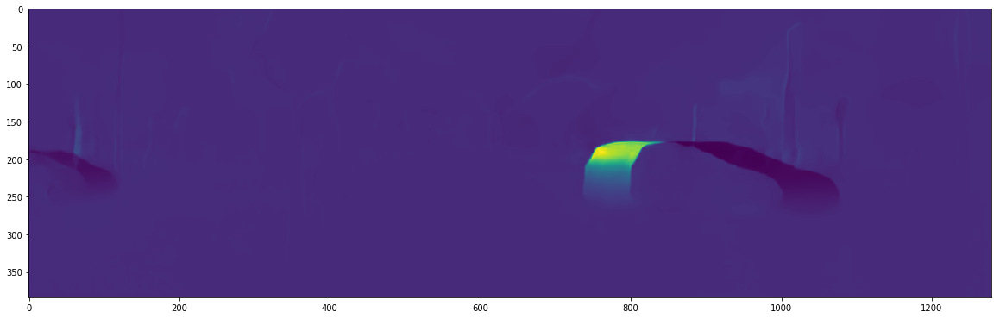

In [14]:
plt.figure(figsize=(20, 10))
plt.imshow(disp1/disp2)

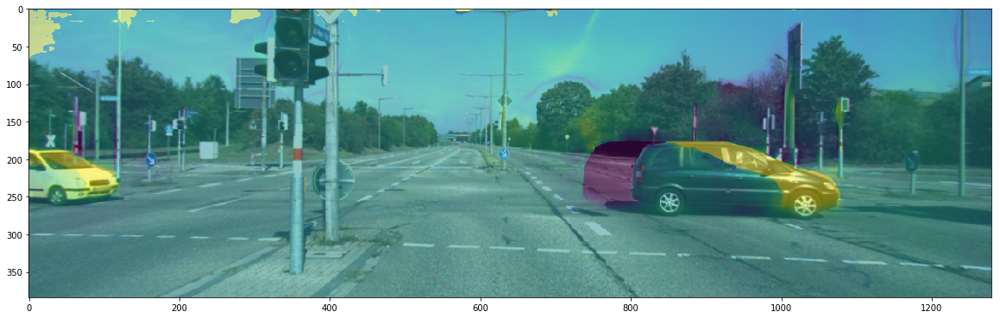

In [15]:
# mask1 = disp1/disp2 < 0.9 # which part to use image1 independent of flow
mask1 = 1/(1+np.exp(10*(disp1/disp2-1))) # soft mask
mask1[np.all(image_warped21==0, axis=-1)] = 1 # fill fly-out area
plt.figure(figsize=(20, 10))
plt.imshow(image2_resized)
plt.imshow(mask1, alpha=0.5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


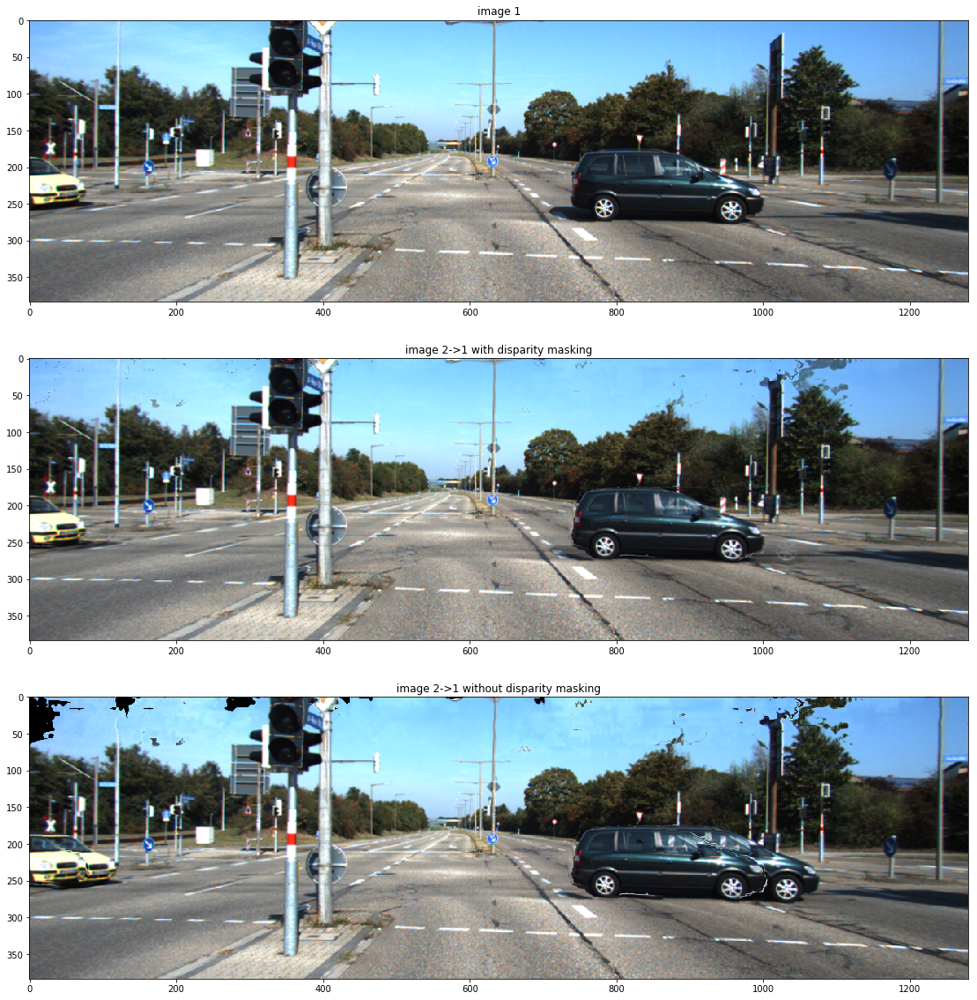

In [16]:
mask1_ = np.tile(mask1[:, :, np.newaxis], (1, 1, 3))
plt.figure(figsize=(20, 20))
plt.subplot(311)
plt.title('image 1')
plt.imshow(image1_resized)
plt.subplot(312)
plt.title('image 2->1 with disparity masking')
plt.imshow(image_warped21*(1-mask1_)+image1_resized/255.0*mask1_)
plt.subplot(313)
plt.title('image 2->1 without disparity masking')
plt.imshow(image_warped21)

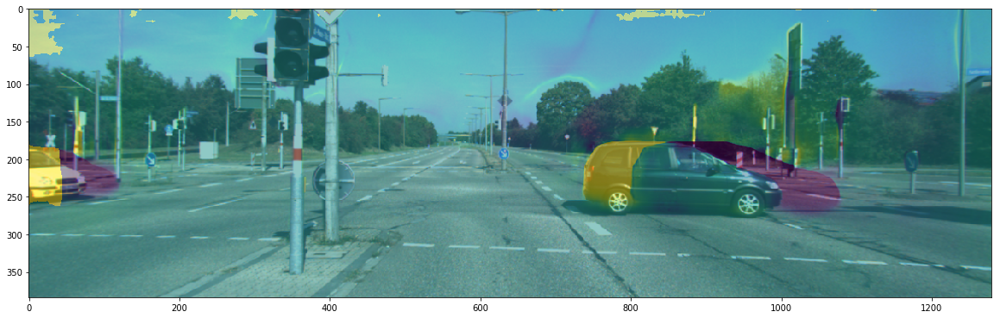

In [17]:
# mask2 = disp2/disp1 < 0.9
mask2 = 1/(1+np.exp(10*(disp2/disp1-1))) # soft mask
mask2[np.all(image_warped12==0, axis=-1)] = 1 # fill fly-out area
plt.figure(figsize=(20, 10))
plt.imshow(image1_resized)
plt.imshow(mask2, alpha=0.5)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


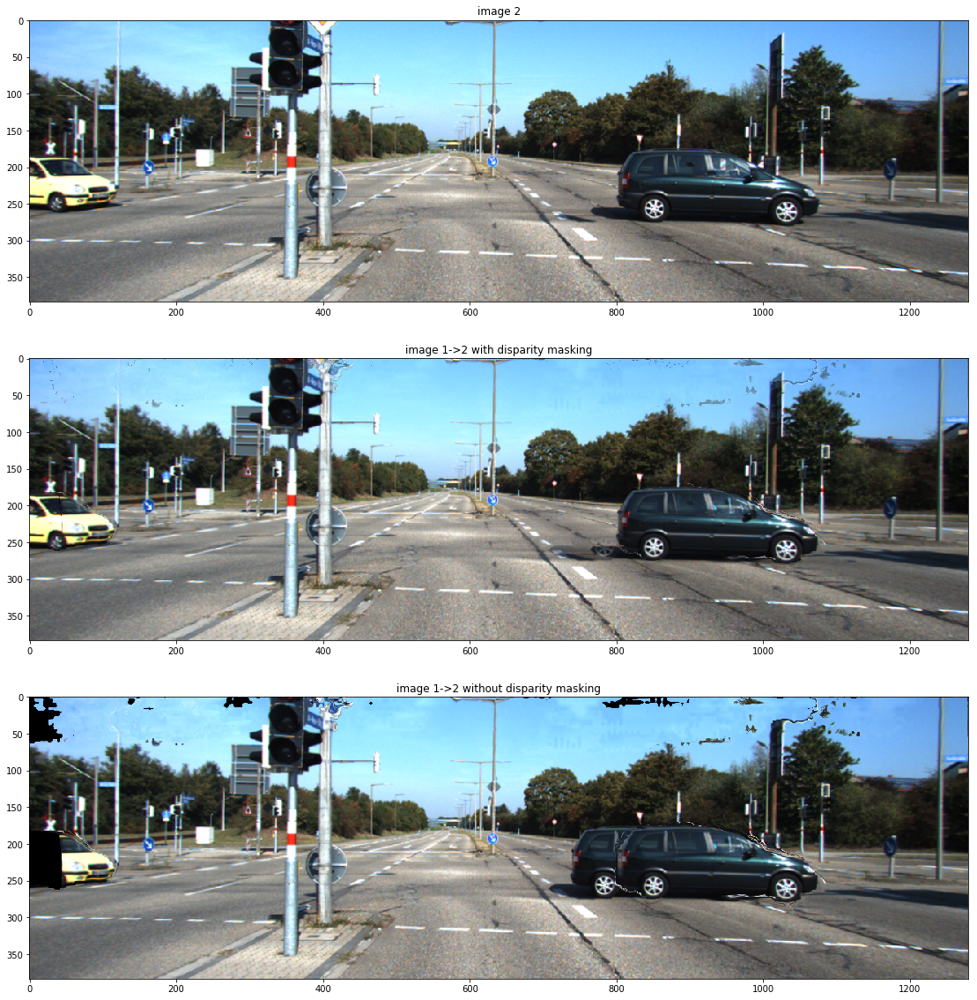

In [18]:
mask2_ = np.tile(mask2[:, :, np.newaxis], (1, 1, 3))
plt.figure(figsize=(20, 20))
plt.subplot(311)
plt.title('image 2')
plt.imshow(image2_resized)
plt.subplot(312)
plt.title('image 1->2 with disparity masking')
plt.imshow(image_warped12*(1-mask2_)+image2_resized/255.0*mask2_)
plt.subplot(313)
plt.title('image 1->2 without disparity masking')
plt.imshow(image_warped12)